In [2]:
#* for data manipulation 
import pandas as pd 
import numpy as np 

import tiling_disk_plots as tdp
import tiling_disk_utils as tdu

#* sometimes needed for creating bins for histograms 
from astropy.stats import knuth_bin_width

#* for plotting: 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set_theme(style="ticks")
sns.set_context("talk")
%matplotlib inline

### import table map

In [3]:
table_map = tdu.read_single_measurement('measurements/Tisch', '20220203_table_after_damage_full.txt')
table_map = tdu.add_ring_nr_label(table_map)
table_map = tdu.df_convert_unix_to_datetime(table_map)
# table_map = table_map.query('-158 < z')

# table_map['z'] = tdu.subtract_mean(table_map['z'])
# table_map['z'] = tdu.convert_mm_to_microns(table_map['z'] )
table_map_pt = tdu.point_table(table_map)
table_map_pt = tdu.add_triplet_color_label(table_map_pt)

In [4]:
table_map_pt

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,trip_color
0,1,1,1.643887e+09,4.20,4.24,-157.962909,0.013954,white
1,1,2,1.643887e+09,3.36,12.56,-157.967385,0.015089,white
2,1,3,1.643887e+09,9.19,9.19,-157.978385,0.014033,white
3,1,4,1.643887e+09,12.56,3.36,-157.989538,0.013529,white
4,1,5,1.643887e+09,19.32,5.18,-157.969462,0.016676,white
...,...,...,...,...,...,...,...,...
1135,19,56,1.643894e+09,-90.89,30.43,-158.008308,0.014197,blue
1136,19,57,1.643894e+09,-84.38,33.13,-157.993308,0.014097,blue
1137,19,58,1.643894e+09,-78.79,37.42,-157.999462,0.014278,blue
1138,19,59,1.643894e+09,-74.50,43.01,-158.009692,0.014364,blue


In [5]:
table_map_pt.z_mean.describe()

count    1140.000000
mean     -157.999025
std         0.021086
min      -158.070308
25%      -158.011923
50%      -157.997462
75%      -157.984308
max      -157.869231
Name: z_mean, dtype: float64

Text(0.5, 1.0, 'Table measurement')

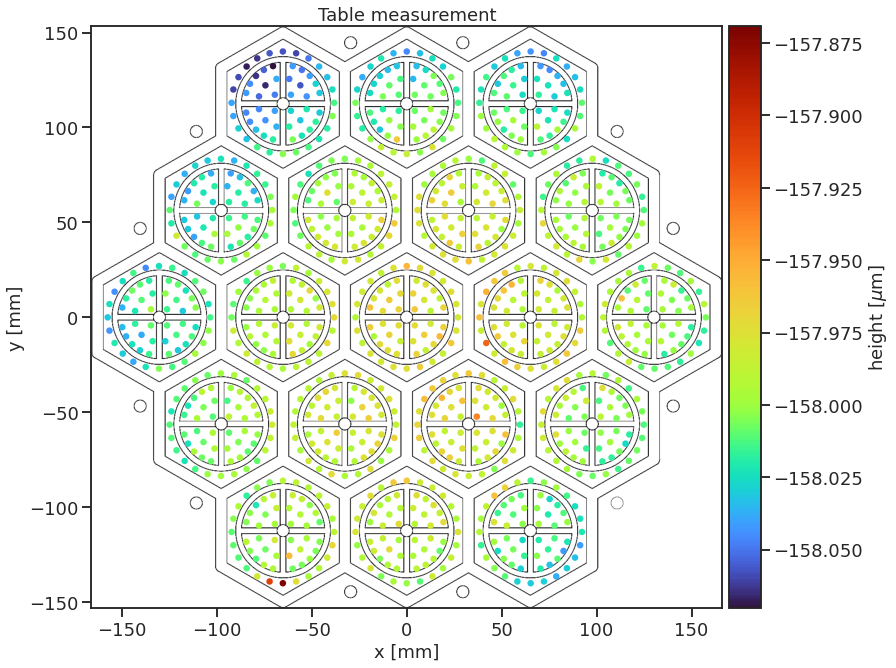

In [6]:
fig, ax = tdp.full_hexagon_plot(table_map_pt, size=5**2, cbar_norm=(-158.070308, -157.999025, -157.869231), cmap='turbo')
ax.set_title('Table measurement')

### Read data

In [7]:
hardening_tripplets_df = tdu.read_single_measurement('measurements/triplets', '20220310_trip_v4_pink_slow_curing.txt')
# hardening_tripplets_df = tdu.add_ring_nr_label(hardening_tripplets_df)


before_hardening_tripplets_df = tdu.read_single_measurement('measurements/triplets', '20220310_trip_v4_pink_slow_bfg_novac.txt')
# before_hardening_tripplets_df = tdu.add_ring_nr_label(before_hardening_tripplets_df)
before_hardening_tripplets_pt = tdu.point_table(before_hardening_tripplets_df)
before_hardening_tripplets_pt = tdu.add_triplet_color_label(before_hardening_tripplets_pt)

### Examine pre glue status

In [8]:
before_hardening_tripplets_pt['z_mean'].describe()

count    540.000000
mean    -156.793497
std        1.727903
min     -157.055538
25%     -157.009692
50%     -156.995654
75%     -156.980538
max     -136.031385
Name: z_mean, dtype: float64

In [9]:
before_hardening_tripplets_pt = before_hardening_tripplets_pt.loc[before_hardening_tripplets_pt['z_mean']<-150,:]

In [10]:
before_hardening_tripplets_pt.keys()

Index(['hex_nr', 'point', 'unix_time', 'x', 'y', 'z_mean',
       'z_measurement_error', 'trip_color'],
      dtype='object')

Text(0.5, 1.0, 'Before Glue: No Vacuum')

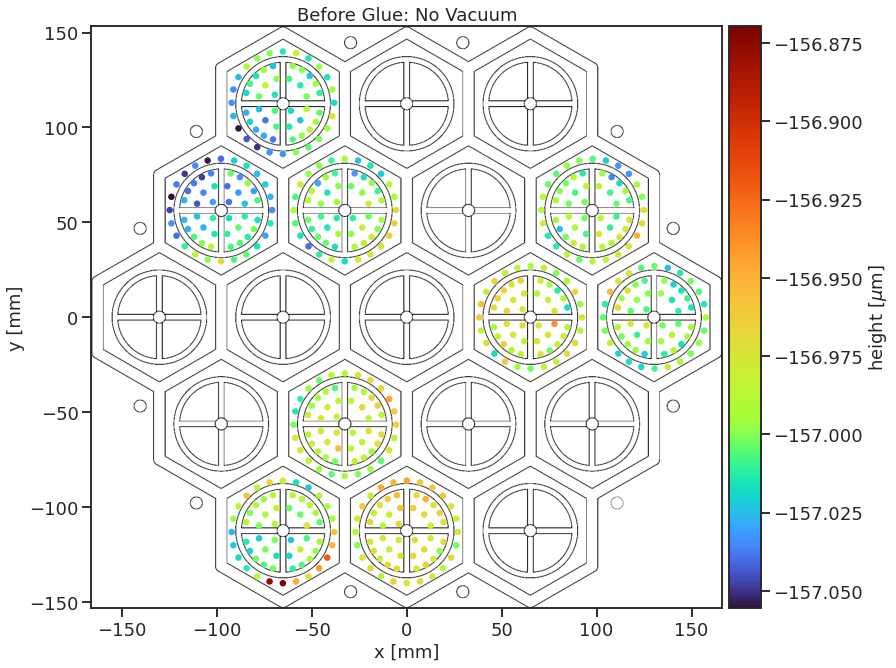

In [11]:
min_bht = before_hardening_tripplets_pt.z_mean.min()
mean_bht = before_hardening_tripplets_pt.z_mean.mean()
max_bht = before_hardening_tripplets_pt.z_mean.max()
fig, ax = tdp.full_hexagon_plot(before_hardening_tripplets_pt, size=5**2, cbar_norm=(min_bht, mean_bht, max_bht), cmap='turbo')
ax.set_title('Before Glue: No Vacuum')

# play around with flatness

In [12]:
before_hardening_tripplets_pt.keys()

Index(['hex_nr', 'point', 'unix_time', 'x', 'y', 'z_mean',
       'z_measurement_error', 'trip_color'],
      dtype='object')

In [13]:
blue_flat = before_hardening_tripplets_pt.loc[before_hardening_tripplets_pt.trip_color=="blue", :]

In [14]:
blue_flat

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,trip_color
121,7,2,1.646900e+09,-29.27,69.07,-157.003154,0.015678,blue
122,7,3,1.646900e+09,-23.44,65.70,-156.998462,0.016881,blue
123,7,4,1.646900e+09,-20.07,59.87,-156.978308,0.015111,blue
124,7,5,1.646900e+09,-13.31,61.69,-156.989923,0.016277,blue
125,7,6,1.646900e+09,-15.31,66.51,-157.008692,0.016170,blue
...,...,...,...,...,...,...,...,...
535,19,56,1.646900e+09,-90.89,30.43,-157.007385,0.015171,blue
536,19,57,1.646900e+09,-84.38,33.13,-157.004846,0.016518,blue
537,19,58,1.646900e+09,-78.79,37.42,-157.015846,0.014793,blue
538,19,59,1.646900e+09,-74.50,43.01,-157.030308,0.014860,blue


# compare before glue to table 

In [21]:
table_map_pt.drop('trip_color', axis=1, inplace=True)

In [22]:
before_hardening_tripplets_pt.drop('trip_color', axis=1, inplace=True)

In [23]:
ref_sub_table = tdu.combine_mean_measurements(before_hardening_tripplets_pt, table_map_pt)

In [24]:
ref_sub_table['z_mean'] = tdu.convert_mm_to_microns(ref_sub_table['z_mean'])

In [25]:
ref_sub_table['z_mean'].describe()

count     532.000000
mean      993.845497
std        22.772357
min       940.384615
25%       978.423077
50%       992.576923
75%      1009.826923
max      1114.692308
Name: z_mean, dtype: float64

In [26]:
plt.hist(ref_sub_table['z_mean'])

(array([ 21.,  92., 155., 132.,  97.,  25.,   8.,   0.,   0.,   2.]),
 array([ 940.38461538,  957.81538462,  975.24615385,  992.67692308,
        1010.10769231, 1027.53846154, 1044.96923077, 1062.4       ,
        1079.83076923, 1097.26153846, 1114.69230769]),
 <BarContainer object of 10 artists>)

In [27]:
tdp.full_hexagon_plot(ref_sub_table, mode=('z_mean'), size=5**2, cbar_norm=(941.692308, 1008.112743, 1104.846154), cmap='turbo', title='Before Glue - Table') #? hier muss auf mm konvertiert werden

(<Figure size 864x864 with 2 Axes>,
 <AxesSubplot:title={'center':'Before Glue - Table'}, xlabel='x [mm]', ylabel='y [mm]'>)

# Proceed with before glue as reference

In [28]:
before_hardening_tripplets_pt
before_hardening_tripplets_pt = tdu.df_convert_unix_to_datetime(before_hardening_tripplets_pt)

In [29]:
before_hardening_tripplets_pt

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,datetime
1,3,2,1.646901e+09,-29.27,-43.95,-156.986077,0.017772,2022-03-10 09:33:42.615384576+01:00
2,3,3,1.646901e+09,-23.44,-47.32,-156.964154,0.016715,2022-03-10 09:33:46.615384576+01:00
3,3,4,1.646901e+09,-20.07,-53.15,-156.985308,0.014439,2022-03-10 09:33:50.384615424+01:00
4,3,5,1.646901e+09,-13.31,-51.33,-156.984769,0.013953,2022-03-10 09:33:54.230769152+01:00
5,3,6,1.646901e+09,-15.31,-46.51,-156.964077,0.015892,2022-03-10 09:33:58+01:00
...,...,...,...,...,...,...,...,...
535,19,56,1.646900e+09,-90.89,30.43,-157.007385,0.015171,2022-03-10 09:13:24.846153728+01:00
536,19,57,1.646900e+09,-84.38,33.13,-157.004846,0.016518,2022-03-10 09:13:28.692307712+01:00
537,19,58,1.646900e+09,-78.79,37.42,-157.015846,0.014793,2022-03-10 09:13:32.538461440+01:00
538,19,59,1.646900e+09,-74.50,43.01,-157.030308,0.014860,2022-03-10 09:13:36.384615424+01:00


In [30]:
tdp.plot_data_vs_time(before_hardening_tripplets_pt, mode="z_mean")

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

### Split Data into runs

In [31]:
hardening_tripplets_df

,run_nr,hex_nr,point,x,y,z,unix_time
0,1,19,1,-93.20,61.00,-156.987,1646907375
1,1,19,1,-93.39,61.19,-156.938,1646907375
2,1,19,1,-93.64,61.25,-156.962,1646907375
3,1,19,1,-93.89,61.19,-157.023,1646907376
4,1,19,1,-94.07,61.00,-156.944,1646907376
...,...,...,...,...,...,...,...
182513,26,11,60,25.65,-120.26,-157.017,1646999394
182514,26,11,60,25.83,-120.44,-156.993,1646999394
182515,26,11,60,26.08,-120.51,-157.011,1646999394
182516,26,11,60,26.33,-120.44,-157.005,1646999394


In [32]:
measurements_dict = {}
for run in hardening_tripplets_df.run_nr.unique(): 
    data = hardening_tripplets_df.loc[hardening_tripplets_df.run_nr == run, :]
    # print(data)
    measurements_dict[f'run_nr_{run}'] = data

In [33]:
measurements_dict['run_nr_1'].keys()

Index(['run_nr', 'hex_nr', 'point', 'x', 'y', 'z', 'unix_time'], dtype='object')

In [34]:
temp_data = measurements_dict['run_nr_1']
temp_data = tdu.df_convert_unix_to_datetime(temp_data)
min_bht = temp_data.z.min()
mean_bht = temp_data.z.mean()
max_bht = temp_data.z.max()
fig, ax = tdp.full_hexagon_plot(temp_data,mode='z', size=3**2, cbar_norm=(mean_bht-0.05, mean_bht, mean_bht+0.05), cmap='turbo')
ax.set_title('temp-data')

/home/breitmod/Nextcloud/Master/Disk_Tiling_Measurements/Fwd MADMAX Laser Scanning/tiling_disk_utils.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['datetime'] = df['unix_time'].apply(lambda x: pd.to_datetime(x, unit='s', utc=True))
/home/breitmod/Nextcloud/Master/Disk_Tiling_Measurements/Fwd MADMAX Laser Scanning/tiling_disk_utils.py:225: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['datetime'] = df['datetime'].dt.tz_convert('Europe/Berlin')


Text(0.5, 1.0, 'temp-data')

In [35]:
plt.hist(temp_data.z)

(array([3.000e+00, 7.700e+01, 5.480e+02, 2.014e+03, 2.626e+03, 1.418e+03,
        3.060e+02, 2.200e+01, 3.000e+00, 1.000e+00]),
 array([-157.145 , -157.0986, -157.0522, -157.0058, -156.9594, -156.913 ,
        -156.8666, -156.8202, -156.7738, -156.7274, -156.681 ]),
 <BarContainer object of 10 artists>)

In [36]:
tdp.plot_data_vs_time(temp_data, mode="z")

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

In [37]:
measurements_dict_pt = {key: tdu.point_table(data) for key, data in measurements_dict.items()}

In [38]:
for run_nr, data in measurements_dict_pt.items(): 
    data['run_nr'] = run_nr.split('_')[2]

In [39]:
measurements_dict_pt['run_nr_1']

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr
0,3,1,1.646910e+09,-28.39,-52.27,-156.923769,0.015799,1
1,3,2,1.646910e+09,-29.27,-43.95,-156.922385,0.015687,1
2,3,3,1.646910e+09,-23.44,-47.32,-156.926077,0.014780,1
3,3,4,1.646910e+09,-20.07,-53.15,-156.916154,0.018491,1
4,3,5,1.646910e+09,-13.31,-51.33,-156.904923,0.015950,1
...,...,...,...,...,...,...,...,...
535,19,56,1.646908e+09,-90.89,30.43,-156.951923,0.014647,1
536,19,57,1.646908e+09,-84.38,33.13,-156.940231,0.015563,1
537,19,58,1.646908e+09,-78.79,37.42,-156.943462,0.014010,1
538,19,59,1.646908e+09,-74.50,43.01,-156.996923,0.015346,1


In [40]:
temp_data = measurements_dict_pt['run_nr_1']
temp_data = tdu.df_convert_unix_to_datetime(temp_data)
min_bht = temp_data.z_mean.min()
mean_bht = temp_data.z_mean.mean()
max_bht = temp_data.z_mean.max()
fig, ax = tdp.full_hexagon_plot(temp_data, size=5**2, cbar_norm=(mean_bht-0.05, mean_bht, mean_bht+0.05), cmap='turbo')
ax.set_title('temp-data')

Text(0.5, 1.0, 'temp-data')

In [41]:
plt.hist(temp_data.z_mean)

(array([  5.,  28.,  61.,  93., 131., 122.,  73.,  23.,   2.,   2.]),
 array([-157.01676923, -157.00164615, -156.98652308, -156.9714    ,
        -156.95627692, -156.94115385, -156.92603077, -156.91090769,
        -156.89578462, -156.88066154, -156.86553846]),
 <BarContainer object of 10 artists>)

In [42]:
tdp.plot_data_vs_time(temp_data, mode="z_mean")

(<Figure size 648x288 with 1 Axes>,
 <AxesSubplot:xlabel='time', ylabel='z [µm]'>)

In [43]:
# for key, data in measurements_dict_pt.items(): 
#     run_nr = int(key.split('_')[2])
#     fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-157.056615, -156.981132, -156.879538), cmap='turbo', title=f'Hour {run_nr -1}')
#     # fig.savefig(f'Vac_timestory/{run_nr}_Measurement.png', dpi='figure', format='png', metadata=None,
#     #     bbox_inches=None, pad_inches=0.1,
#     #     facecolor='auto', edgecolor='auto',
#     #     backend=None
#     #    )
#     # plt.close()

In [44]:
measurements_dict_pt = {key: tdu.add_triplet_color_label(data) for key, data in measurements_dict_pt.items()}

In [45]:
measurements_dict_pt = {key: tdu.df_convert_unix_to_datetime(data) for key, data in measurements_dict_pt.items()}

In [46]:
measurements_dict_pt["run_nr_1"]

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr,datetime,trip_color
0,3,1,1.646910e+09,-28.39,-52.27,-156.923769,0.015799,1,2022-03-10 11:58:23.846153728+01:00,yellow
1,3,2,1.646910e+09,-29.27,-43.95,-156.922385,0.015687,1,2022-03-10 11:58:31+01:00,yellow
2,3,3,1.646910e+09,-23.44,-47.32,-156.926077,0.014780,1,2022-03-10 11:58:37.153846272+01:00,yellow
3,3,4,1.646910e+09,-20.07,-53.15,-156.916154,0.018491,1,2022-03-10 11:58:43.307692288+01:00,yellow
4,3,5,1.646910e+09,-13.31,-51.33,-156.904923,0.015950,1,2022-03-10 11:58:49.538461440+01:00,yellow
...,...,...,...,...,...,...,...,...,...,...
535,19,56,1.646908e+09,-90.89,30.43,-156.951923,0.014647,1,2022-03-10 11:22:42.846153728+01:00,blue
536,19,57,1.646908e+09,-84.38,33.13,-156.940231,0.015563,1,2022-03-10 11:22:49.538461440+01:00,blue
537,19,58,1.646908e+09,-78.79,37.42,-156.943462,0.014010,1,2022-03-10 11:22:56.538461440+01:00,blue
538,19,59,1.646908e+09,-74.50,43.01,-156.996923,0.015346,1,2022-03-10 11:23:03.692307712+01:00,blue


In [47]:
for data in measurements_dict_pt.values(): 
    data = data.loc[data.hex_nr==11 or data.hex_nr==10,:]
    tdp.plot_data_vs_time(data, mode="z_mean")

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [ ]:
measurements_dict_pt = {key: tdu.combine_mean_measurements(data, before_hardening_tripplets_pt) for key, data in measurements_dict_pt.items()}

In [ ]:
for key, data in measurements_dict_pt.items():
    data['z_mean'] = data['z_mean'].apply(lambda z: z*1e3) #* mm -> µm
    data['z_measurement_error'] = data['z_measurement_error'].apply(lambda z: z*1e3) #* mm -> µm
    measurements_dict_pt[key] = data

In [ ]:
measurements_dict_pt['run_nr_1']

,hex_nr,point,unix_time,x,y,z_mean,z_measurement_error,run_nr,datetime,trip_color
0,3,1,1.646910e+09,-28.39,-52.27,NaN,NaN,1,2022-03-10 11:58:23.846153728+01:00,yellow
1,3,2,1.646910e+09,-29.27,-43.95,63.692308,23.704542,1,2022-03-10 11:58:31+01:00,yellow
2,3,3,1.646910e+09,-23.44,-47.32,38.076923,22.312548,1,2022-03-10 11:58:37.153846272+01:00,yellow
3,3,4,1.646910e+09,-20.07,-53.15,69.153846,23.460714,1,2022-03-10 11:58:43.307692288+01:00,yellow
4,3,5,1.646910e+09,-13.31,-51.33,79.846154,21.192165,1,2022-03-10 11:58:49.538461440+01:00,yellow
...,...,...,...,...,...,...,...,...,...,...
535,19,56,1.646908e+09,-90.89,30.43,55.461538,21.087589,1,2022-03-10 11:22:42.846153728+01:00,blue
536,19,57,1.646908e+09,-84.38,33.13,64.615385,22.695045,1,2022-03-10 11:22:49.538461440+01:00,blue
537,19,58,1.646908e+09,-78.79,37.42,72.384615,20.374152,1,2022-03-10 11:22:56.538461440+01:00,blue
538,19,59,1.646908e+09,-74.50,43.01,33.384615,21.361594,1,2022-03-10 11:23:03.692307712+01:00,blue


/home/breitmod/Nextcloud/Master/Disk_Tiling_Measurements/Fwd MADMAX Laser Scanning/tiling_disk_plots.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=figsize)


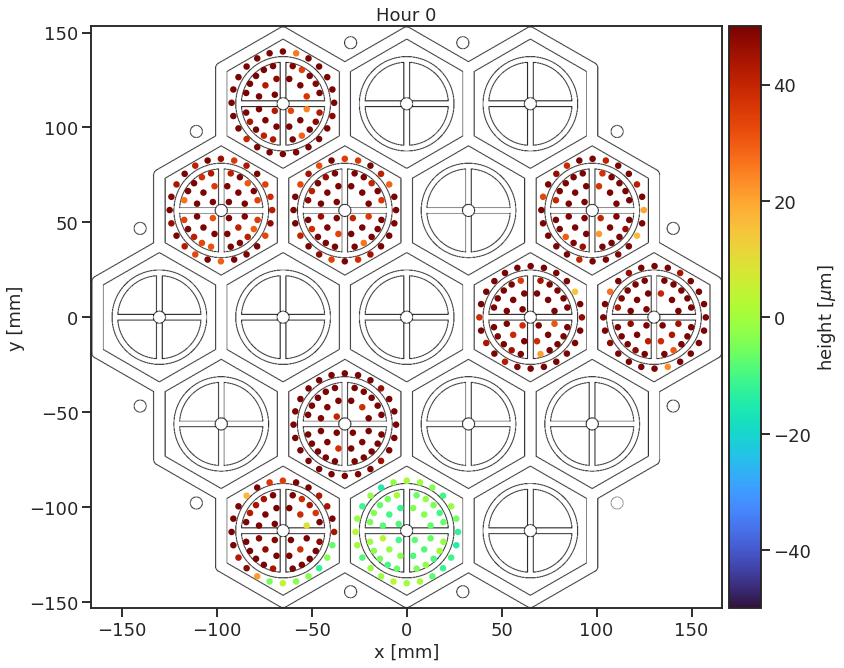

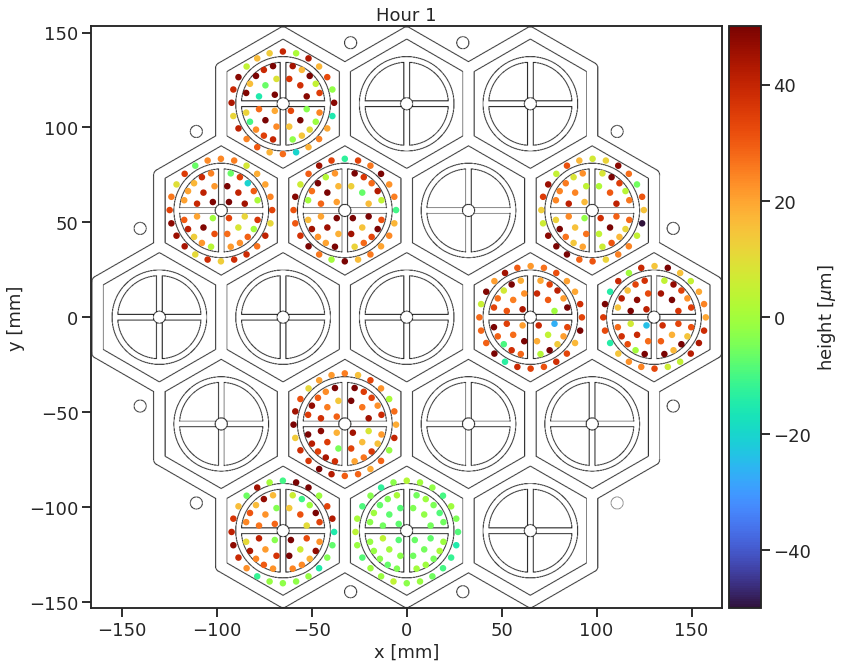

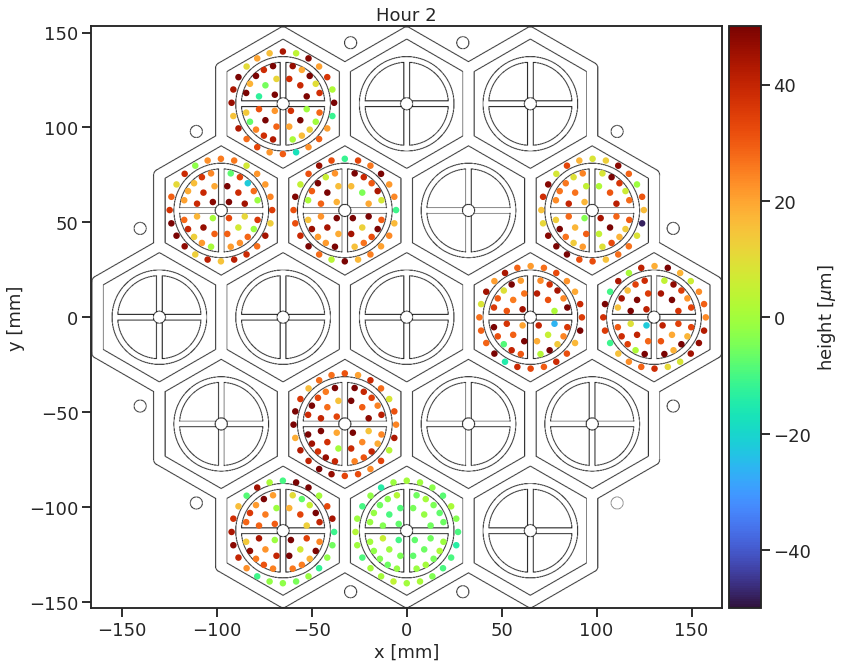

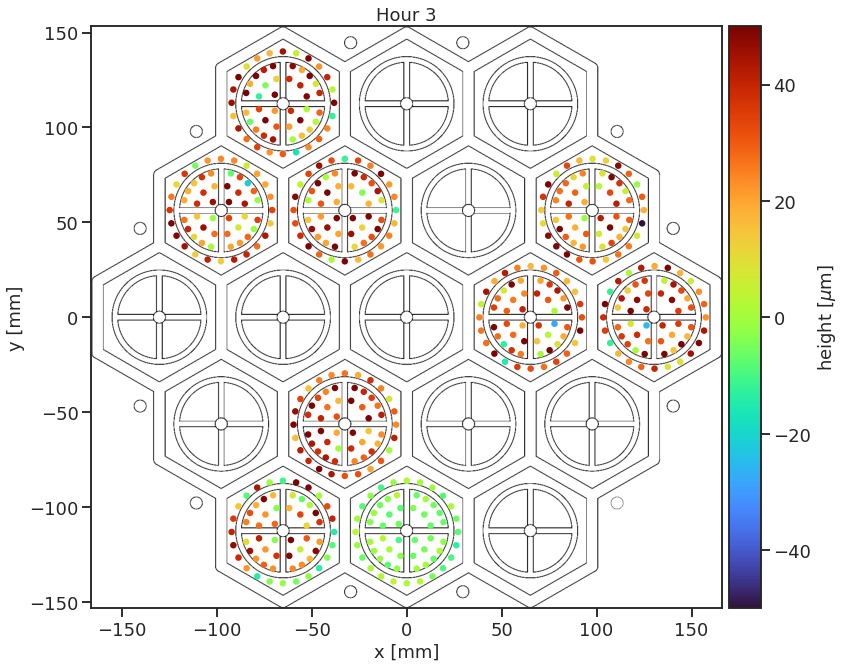

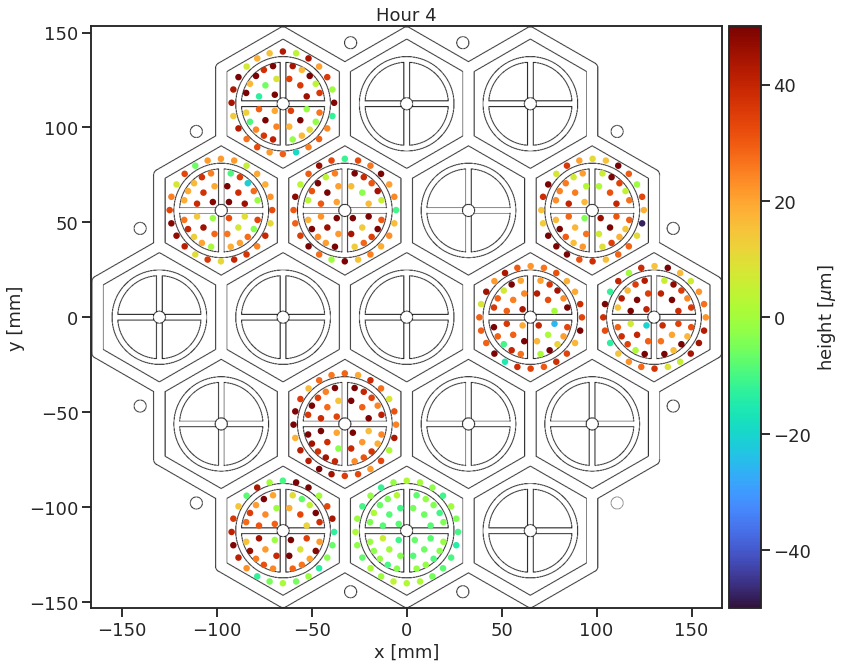

...

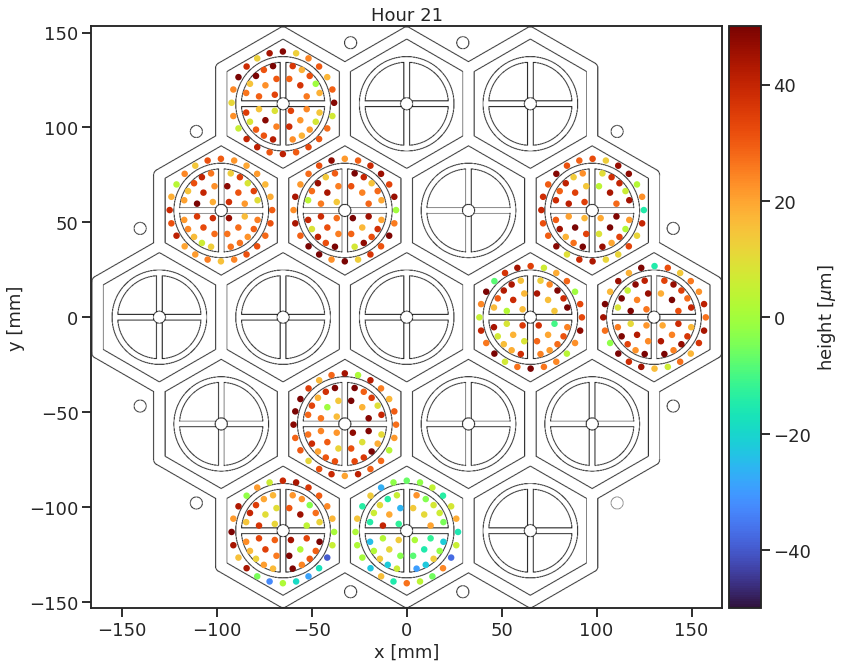

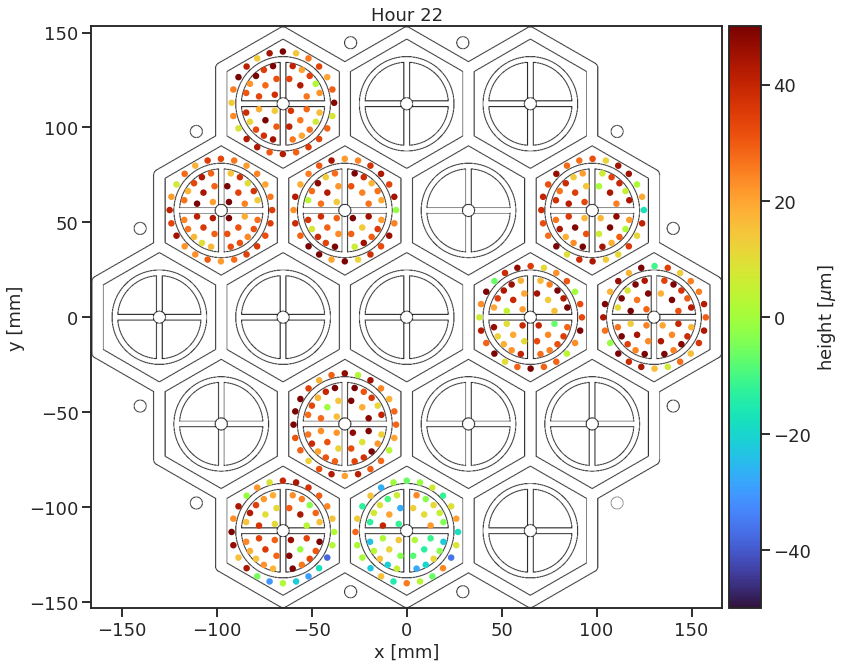

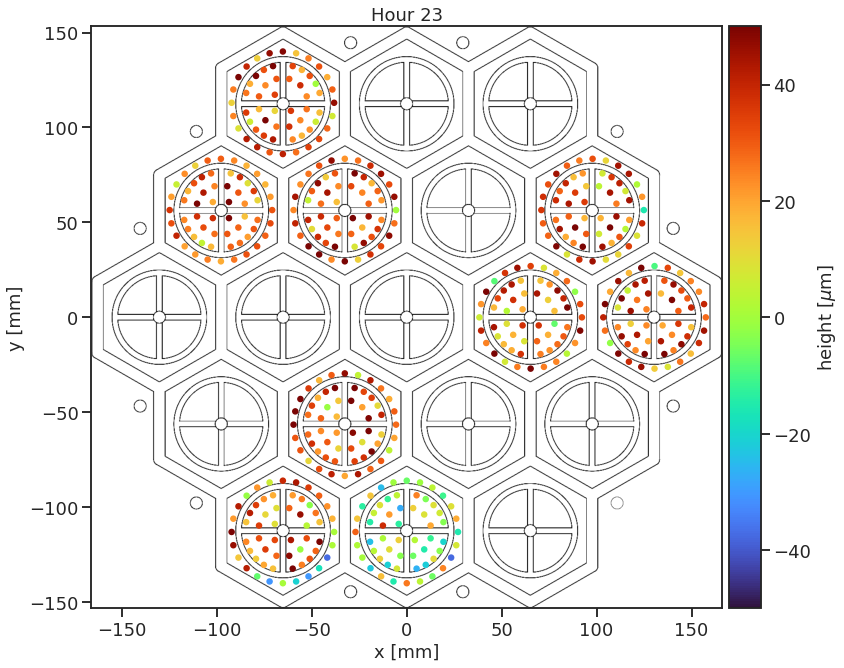

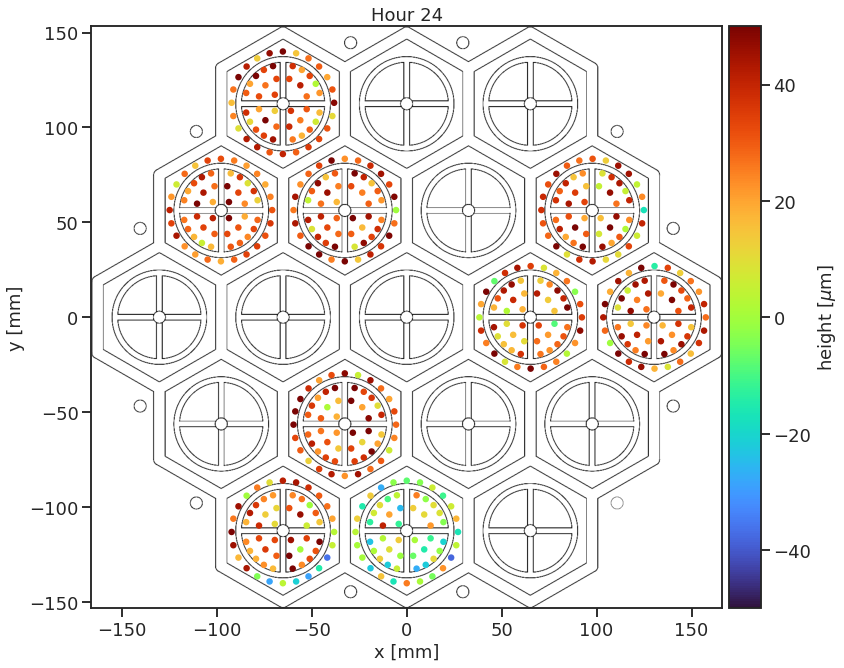

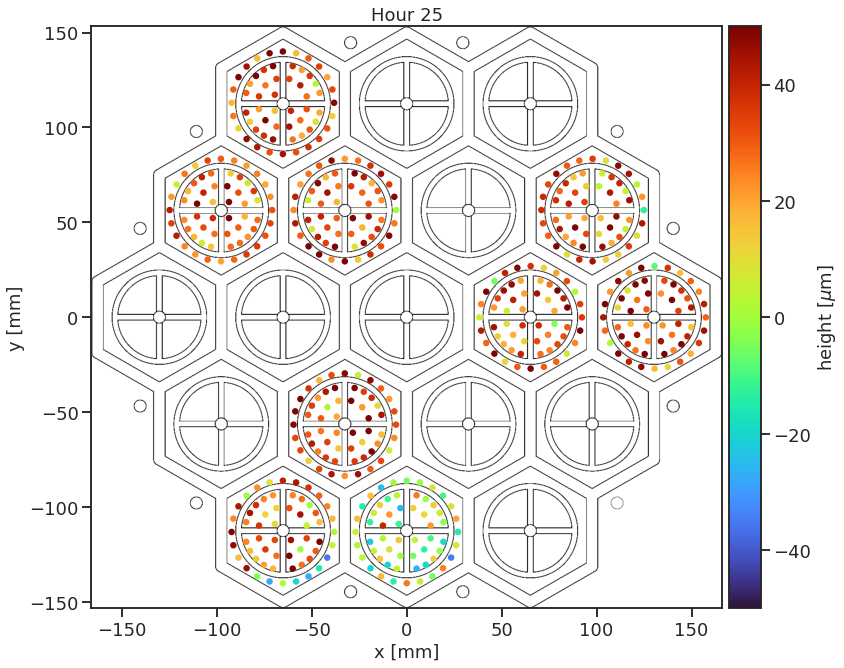

In [ ]:
for key, data in measurements_dict_pt.items(): 
    run_nr = int(key.split('_')[2])
    fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-50, 0, 50), cmap='turbo', title=f'Hour {run_nr -1}')
    # fig.savefig(f'Vac_timestory/{run_nr}_Measurement.png', dpi='figure', format='png', metadata=None,
    #     bbox_inches=None, pad_inches=0.1,
    #     facecolor='auto', edgecolor='auto',
    #     backend=None
    #    )
    # plt.close()

# hier kommt jetzt der joyplot

erstmal die funktion schreiben um verteilung von einem triplet in einem run zu sehen 

In [ ]:
# for key, data in measurements_dict_pt.items(): 
#     run_nr = int(key.split('_')[2])
#     data = data.loc[data.trip_color=='blue',:]
#     tdp.ts_hist(data, mode='z_mean')


In [ ]:
def plot_triplet_dist_joyplot(all_triplet_data_dict, triplet_color='blue'): 

    from matplotlib import cm
    n_hours = len(all_triplet_data_dict)
    colors = cm.viridis_r(np.linspace(0, 1, n_hours))
    rgb_colors = [cm.winter_r(np.linspace(0, 1, n_hours)), cm.autumn_r(np.linspace(0, 1, n_hours)), cm.copper_r(np.linspace(0, 1, n_hours))]
    fig, axes = plt.subplots(n_hours,1, figsize=(6,14))
    i = 0
    z_global_max = 0 
    z_global_min = 0
    for key, data in all_triplet_data_dict.items(): 
        z_min = data.z_mean.min()
        z_max = data.z_mean.max()
        if z_max > z_global_max: z_global_max = np.rint(z_max)
        if z_min < z_global_min: z_global_min = np.rint(z_min)
    # print(z_global_max)
    # print(z_global_min)
    if z_global_max > 500: z_global_max = 100
    if z_global_min < -500: z_global_min = -100
    # print(z_global_max)
    # print(z_global_min)
    
    for (key, data), ax in zip(all_triplet_data_dict.items(), axes): 
        run_nr = int(key.split('_')[2])
        data = data.loc[data.trip_color==triplet_color,:]
        z_min = data.z_mean.min()
        z_max = data.z_mean.max()
        R = z_max - z_min
        R = np.round(R,2) 
        
        nbins = np.arange(z_global_min, z_global_max ,6)

        for (hex_nr,rgb) in zip(data.hex_nr.unique(), rgb_colors):
            # print(hex_nr)
            data_temp = data.loc[data.hex_nr==hex_nr,:]
            # print(f'hex_nr : {data.hex_nr.unique()}')
            sns.histplot(data_temp['z_mean'], kde=False, ax=ax, element='step', color=rgb[i],
                        stat='probability', label=f'Hour {run_nr-1}', fill=True, alpha=0.4, 
                        bins=nbins,)
            
        ax.spines.top.set_color('none')
        ax.spines.right.set_color('none')
        ax.axvline(0,0,1, ls='--', color='black')
        # ax.grid(True)
        plt.subplots_adjust(hspace=-0.3)
        # make background transparent
        rect = ax.patch
        rect.set_alpha(0)3
        # remove borders, axis ticks, and labels
        ax.set_yticklabels([])
        ax.set_yticks([])
        ax.set_ylabel('')
        if i == n_hours - 1:
            ax.set_xlabel('z [µm]')
        else:
            ax.set_xticklabels([])
            ax.set_xticks([])
            ax.set_xlabel('')
        i+=1

        spines = ["top","right","left","bottom"]
        for s in spines:
            ax.spines[s].set_visible(False)
        ax.text(z_global_min -2 ,0.02,f'Hour {run_nr-1}',fontweight="bold",fontsize=14,ha="right", va='center')
        ax.text(z_global_max+2 ,0.02,f'R={R}',fontweight="bold",fontsize=14,ha="left", va='center')
    fig.text(0.07,0.9,f"{triplet_color} Triplet Distribution over Time",fontsize=18)
    return fig, axes

SyntaxError: invalid syntax (1458243086.py, line 48)

(<Figure size 432x1008 with 26 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:xlabel='z [µm]'>], dtype=object))

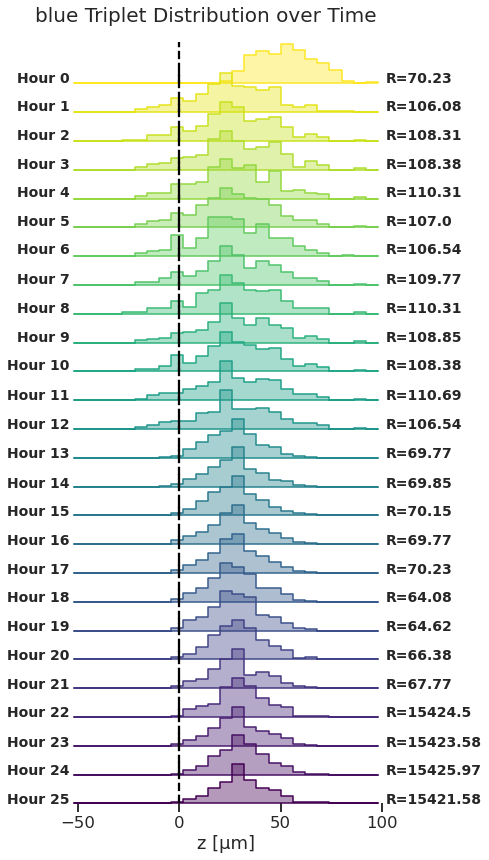

In [ ]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'blue')

(<Figure size 432x1008 with 26 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:xlabel='z [µm]'>], dtype=object))

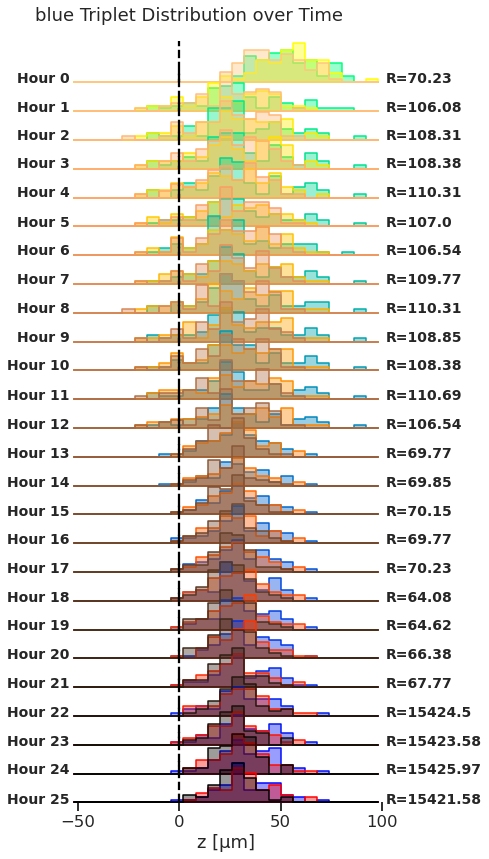

In [ ]:
plot_triplet_dist_joyplot(measurements_dict_pt, 'blue')

(<Figure size 432x1008 with 26 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:xlabel='z [µm]'>], dtype=object))

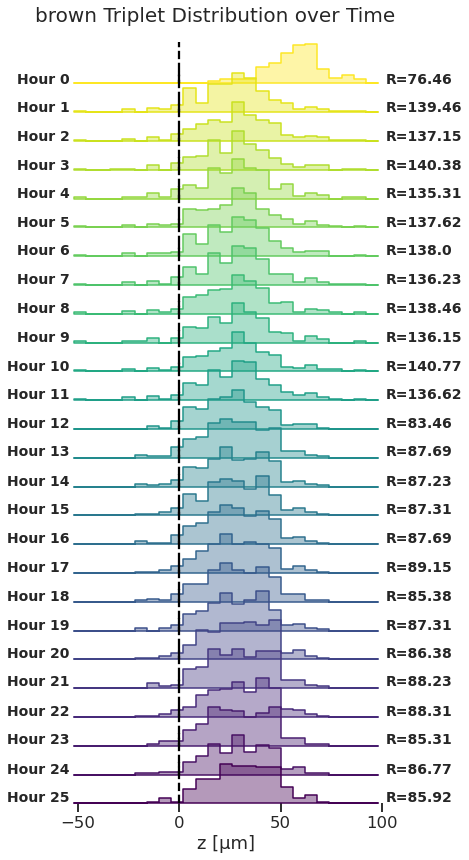

In [ ]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'brown')

(<Figure size 432x1008 with 26 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:xlabel='z [µm]'>], dtype=object))

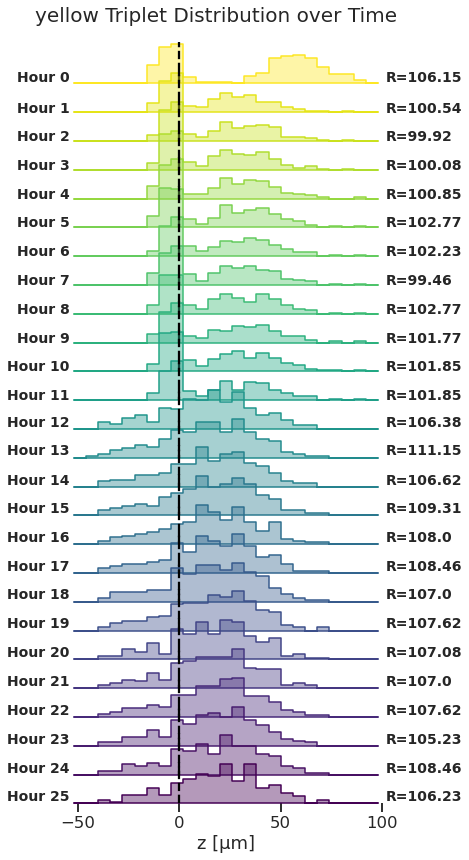

In [ ]:
tdp.plot_triplet_dist_joyplot(measurements_dict_pt, 'yellow')